<a href="https://colab.research.google.com/github/ujjawalkumar-deloitte/Seat-belt-detection-/blob/main/Seat_Belt_Detection1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Cloning into 'yolov5'...
remote: Enumerating objects: 14424, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 14424 (delta 15), reused 22 (delta 9), pack-reused 14379
Receiving objects: 100% (14424/14424), 13.41 MiB | 11.95 MiB/s, done.
Resolving deltas: 100% (9965/9965), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 4.2 MB/s 
     |████████████████████████████████| 145 kB 6.0 MB/s 
     |████████████████████████████████| 178 kB 46.6 MB/s 
     |████████████████████████████████| 67 kB 5.2 MB/s 
     |████████████████████████████████| 54 kB 2.0 MB/s 
     |████████████████████████████████| 138 kB 52.6 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
Setup complete. Using torch 1.12.1+cu113 (CPU)


In [6]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [7]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

# New Section

In [8]:

from roboflow import Roboflow
rf = Roboflow(api_key="P6Mpy9M24Eb8Bd1bY5ZJ")
project = rf.workspace("seat-belt-fastening").project("detection-seat-belt")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Detection-seat-belt-2 in yolov5pytorch:: 100%|██████████| 424/424 [00:00<00:00, 1444.94it/s]


In [9]:
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Detection-seat-belt-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.0

In [10]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [11]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/Detection-seat-belt-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/21 /content/datasets/Detection-seat-belt-2/test/images/img_101_jpg.rf.85e6c1509dc8d48ce8135f7e1a865d03.jpg: 416x416 1 seat belt detected, 225.0ms
image 2/21 /content/datasets/Detection-seat-belt-2/test/images/img_112_jpg.rf.53e70df01e0d1afb1c152acfbdf9f94a.jpg: 416x416 1 seat belt detected, 182.3ms
image 3/21 /content

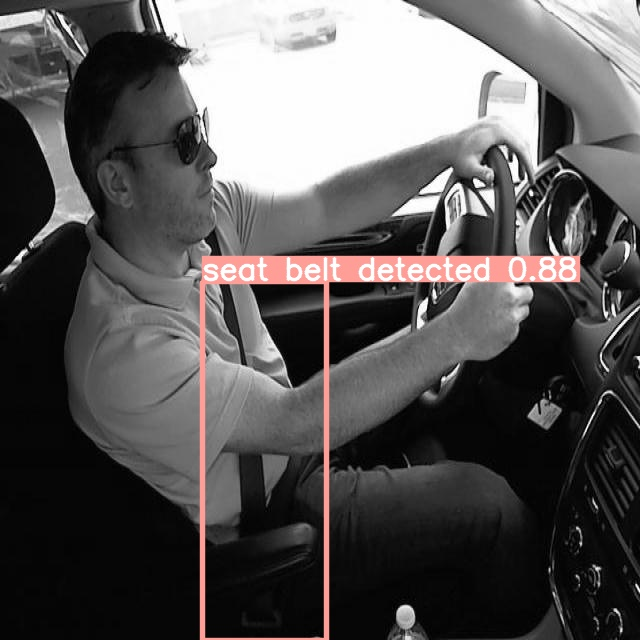

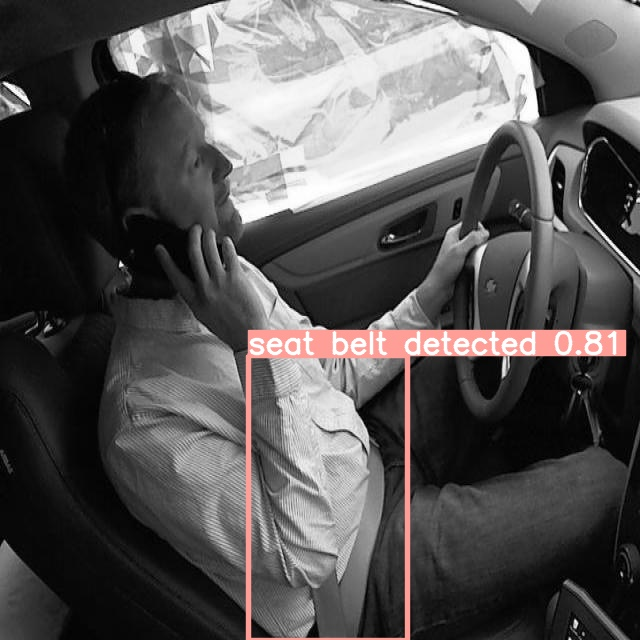

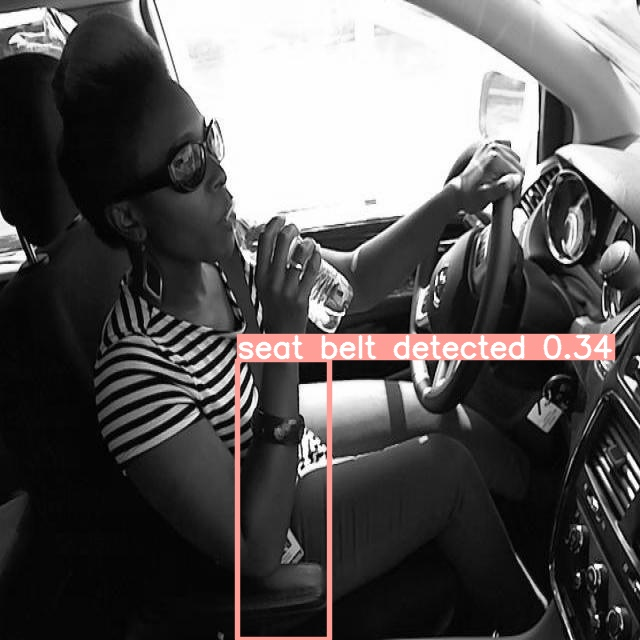

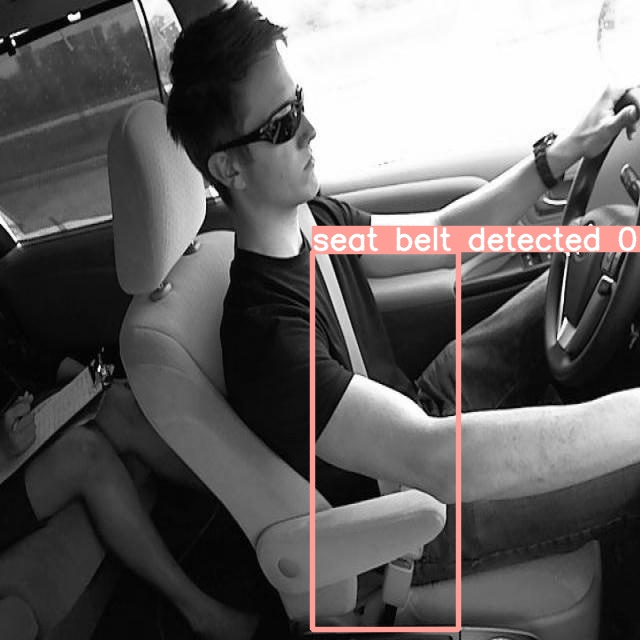

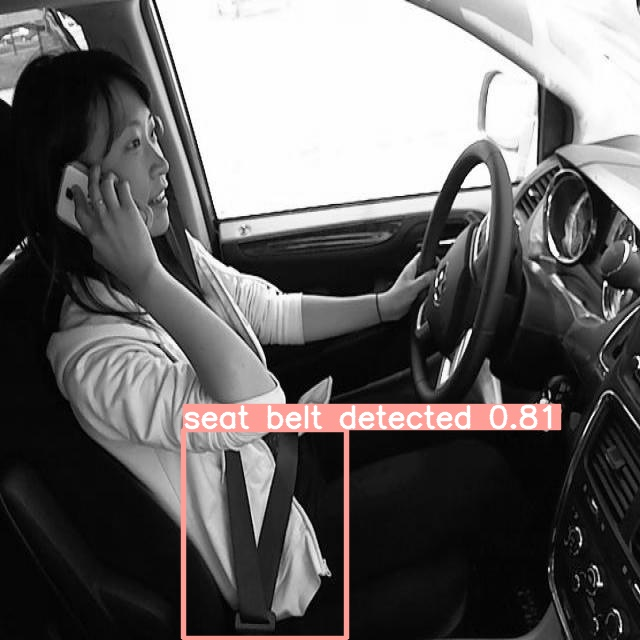

...

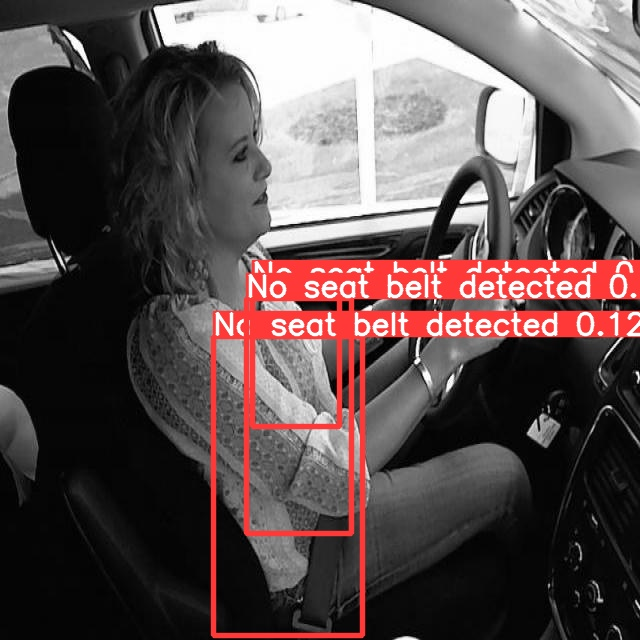

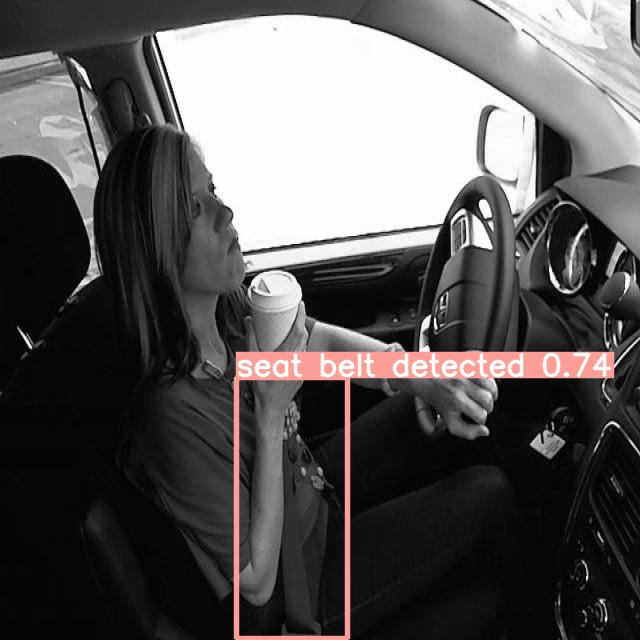

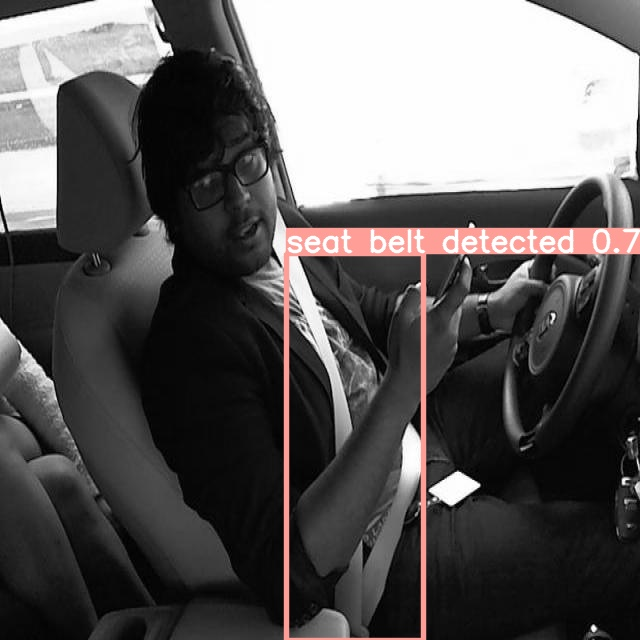

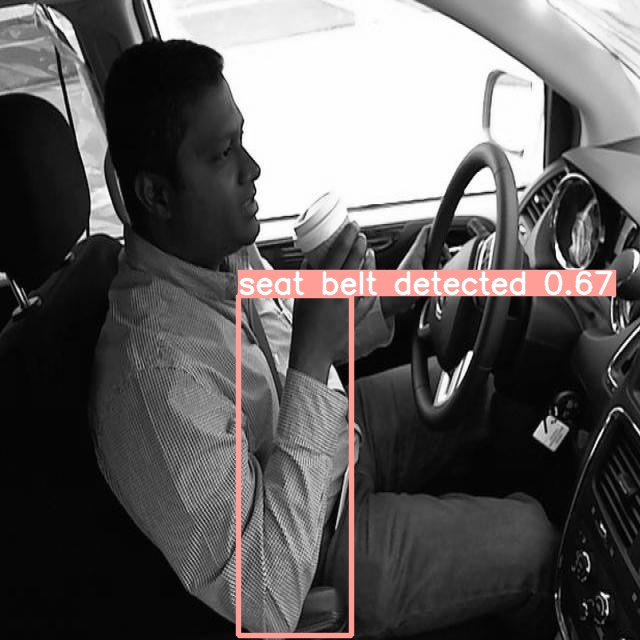

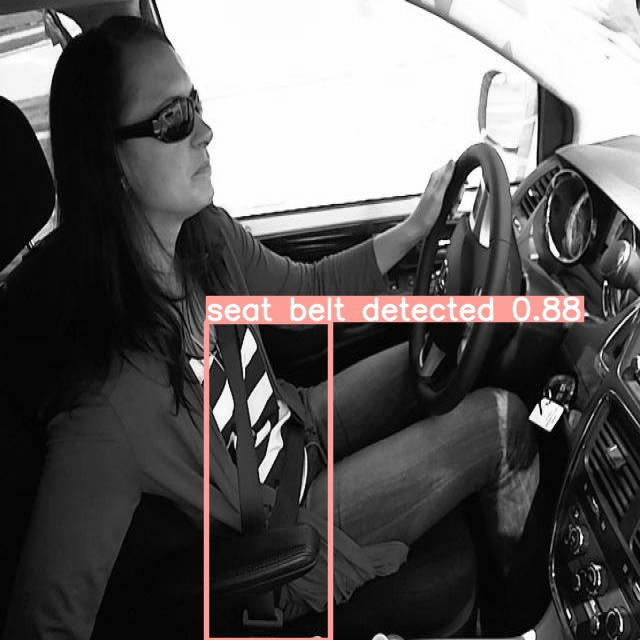

In [12]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [16]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/Detection-seat-belt-2/data.yaml --img 416 --iou 0.65 --half

val: data=/content/datasets/Detection-seat-belt-2/data.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/datasets/Detection-seat-belt-2/valid/labels.cache' images and labels... 41 found, 0 missing, 0 empty, 0 corrupt: 100% 41/41 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/2 [00:00<?, ?it/s]
Traceback (most recent call last):
  File "val.py", line 406, in <module>
    main(opt)
  File "val.py", line 379, in main
    run(**vars(opt))
  File "/usr/local

In [17]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   results.csv
events.out.tfevents.1666934922.3049562ed4e7.267.0  results.png
F1_curve.png					   train_batch0.jpg
hyp.yaml					   train_batch1.jpg
labels_correlogram.jpg				   train_batch2.jpg
labels.jpg					   val_batch0_labels.jpg
opt.yaml					   val_batch0_pred.jpg
P_curve.png					   val_batch1_labels.jpg
PR_curve.png					   val_batch1_pred.jpg
R_curve.png					   weights


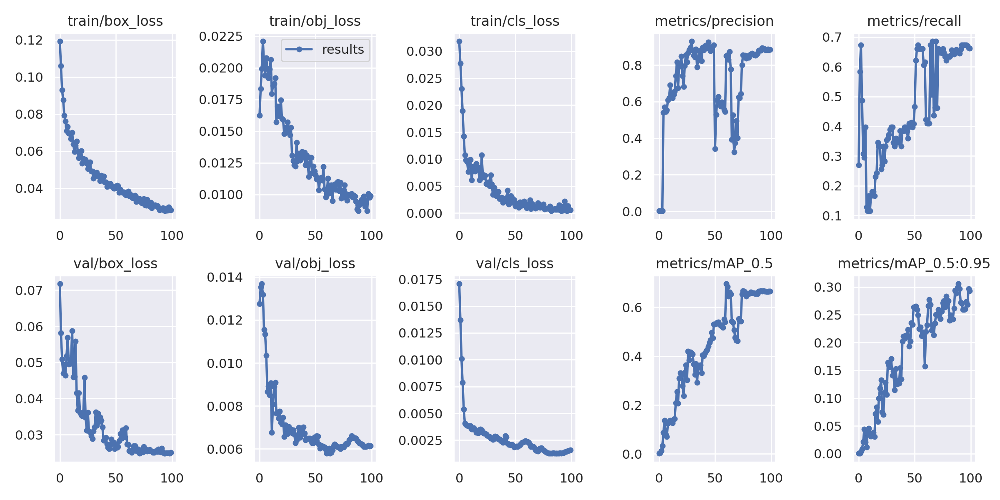

In [18]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='runs/train/yolov5s_results/results.png', width=1000)  # view results.png
# Image(filename='runs/train/yolov5s_results/P_curve.png', width=1000)  # view results.png

In [43]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/img_105.jpg

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/img_105.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/img_105.jpg: 320x416 2 seat belt detecteds, 143.8ms
Speed: 1.4ms pre-process, 143.8ms inference, 0.9ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp13


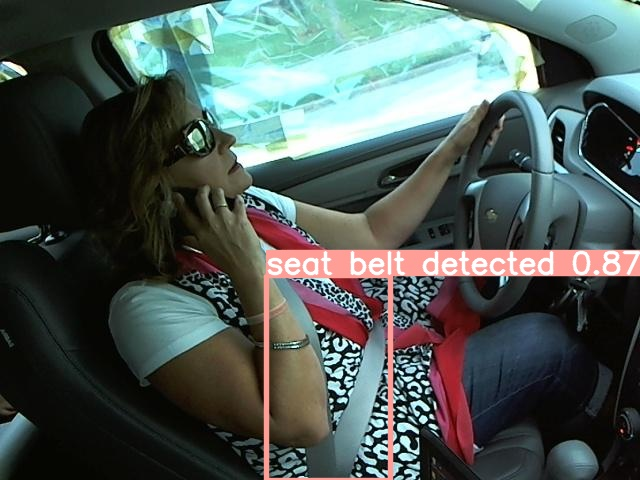

In [57]:

for imageName in glob.glob('runs/detect/exp12/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")